## 1. Install and import library 

In Colab OpenCV is preinstalled. [Use pip3 install opencv-contrib-python on your computer to install. Next time, not today] 

In [0]:
import numpy as np
import cv2 as cv # OpenCV library
from google.colab.patches import cv2_imshow # colab-specific function 

In [0]:
cv.__version__ # check version of OpenCV

'3.4.3'

## 2. Load image

In [0]:
img = cv.imread('car.jpg')

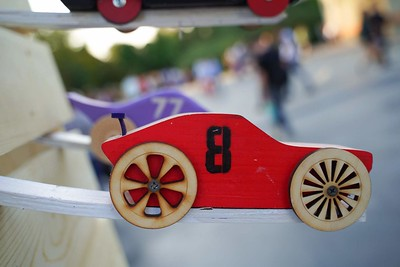

In [0]:
# show image
cv2_imshow(img) # in a non-colab env use cv2.imshow('frame', img)

## 3. Basic operations

**Let's create image from scratch**

uint8 - insigned integer 8 bit (только положительные целые числа, для хранения зарезервировано 8 бит вместо 4 у обычного int -> очень большие значения можно хранить)

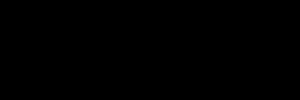

In [0]:
height = 100
width = 300

img_black = np.zeros((height, width, 3), np.uint8)
cv2_imshow(img_black)

All pixels number

In [0]:
img_black.size

90000

Shape
returns height, width, channels (3 for RGB, 1 for grayscale)

In [0]:
img_black.shape 

(100, 300, 3)

Slicing or cropping operations - because it is just a 2D array (matrix)!





In [0]:
cv2_imshow(img_black[10:20, 20:50])

In [0]:
print(img_black)

Доступ к пикселю по индексу (2D-массив - строка, столбец)




In [0]:
print(img_black[50,50])

[255   0   0]


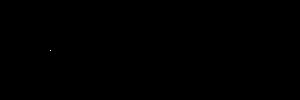

In [0]:
img_black[50,50] = 255
cv2_imshow(img_black)

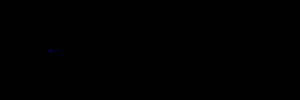

In [0]:
img_black[50,50] = (255, 0, 0)
cv2_imshow(img_black)

Saving image

---



In [0]:
cv.imwrite('newimg.jpg', img_black)

True

Image Pyraminds (from opecnv.org)

* Usually we need to convert an image to a size different than its original. For this, there are two possible options:
  1. Upsize the image (zoom in) or
  2. Downsize it (zoom out).
* Although there is a geometric transformation function in OpenCV that -literally- resize an image (resize , which we will show in a future tutorial), in this section we analyze first the use of Image Pyramids, which are widely applied in a huge range of vision applications.


**When we reduce the size of an image, we are actually losing information of the image.**



In [0]:
img = cv.imread("car.png")
rows, cols, _channels = map(int, src.shape)
print(rows, cols, _channels)

#img_up = cv.pyrUp(img, dstsize=(2 * cols, 2 * rows))
#cv2_imshow(img_up)

img_down = cv.pyrDown(img, dstsize=(cols // 2, rows // 2))
cv2_imshow(img_down)


## 4. Color channels: RGB is BGR in OpenCV

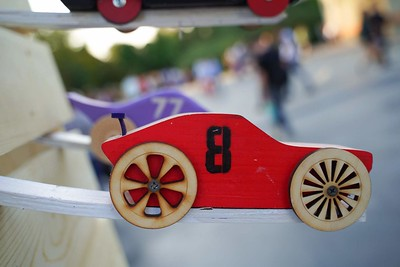

In [0]:
photo = cv.imread('car.jpg')
cv2_imshow(photo)

In [0]:
photo.shape

(267, 400, 3)

In [0]:
photo.shape[0] # get only height

267

In [0]:
photo[100, 100]

array([153, 132, 141], dtype=uint8)

In [0]:
photo[100, 100] = (255, 0, 0)

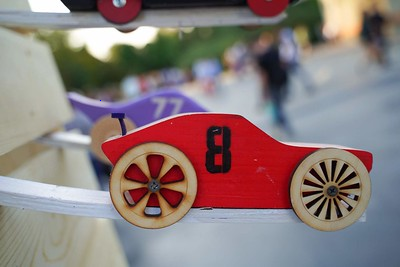

In [0]:
cv2_imshow(photo)

BGR image

---



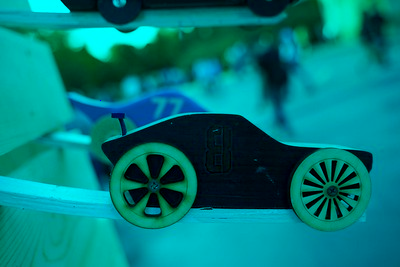

In [0]:
copy_photo = photo
copy_photo[:, :, 2] = 0 # all RED pixels are now 0
cv2_imshow(copy_photo)

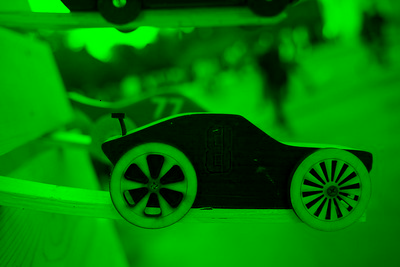

In [0]:
copy_photo[:, :, 0] = 0 # all BLUE pixels TOO are now 0
cv2_imshow(copy_photo)

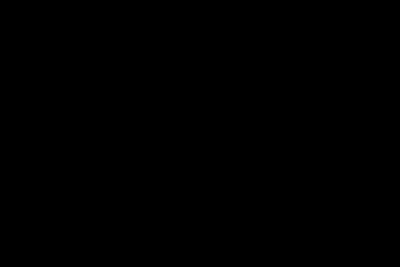

In [0]:
copy_photo[:, :, 1] = 0 # all GREEN pixels TOO are now 0
cv2_imshow(copy_photo)

## 5. Transformations

**Scale**

Because by default photo from my phone is too large

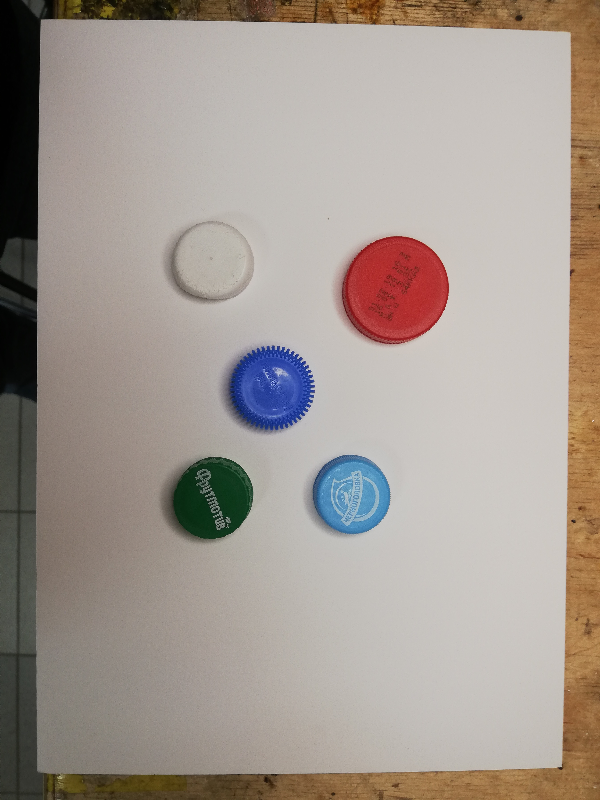

In [0]:
caps = cv.imread('caps.jpg')

res = cv.resize(caps,None,fx=2, fy=2, interpolation = cv.INTER_CUBIC)

#OR

#height, width = caps.shape[:2]
caps_scaled = cv.resize(caps,(600, 800), interpolation = cv.INTER_CUBIC) # only int
cv2_imshow(caps_scaled)

**Rotate** (opencv.org)

OpenCV provides scaled rotation with adjustable center of rotation so that you can rotate at any location you prefer. Modified transformation matrix is given by

![alt text](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/math/91ff2b9b1db0760f4764631010749e594cdf5f5f.png)

where

![alt text](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/math/383c254fc602c57a059a8296357f90fdf421aee7.png)

In [0]:
rows,cols, _ = caps_scaled.shape

M = cv.getRotationMatrix2D((cols/2,rows/2), 90, 1)
dst = cv.warpAffine(caps, M, (cols,rows))
cv2_imshow(dst)

**Translate** (opencv.org) 

Translation is the shifting of object’s location. If you know the shift in (x,y) direction, let it be (t_x,t_y), you can create the transformation matrix M as follows:
![alt text](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/math/22fe551f03b8e94f1a7a75731a660f0163030540.png)


In [0]:
rows,cols = caps.shape

M = np.float32([[1,0,100],[0,1,50]])
dst = cv.warpAffine(caps_scaled,M,(cols,rows))
cv2_imshow(dst)

## 6. Changing colorspace RGB, BGR, HSV, channels


In OpenCV we use HSV instead of RGB (actually, RGB is BGR in OpenCV)

HSV (hue, saturation, value) colorspace is a model to represent the colorspace similar to the RGB color model. Since the hue channel models the color type, it is very useful in image processing tasks that need to segment objects based on its color. Variation of the saturation goes from unsaturated to represent shades of gray and fully saturated (no white component). Value channel describes the brightness or the intensity of the color. Next image shows the HSV cylinder. (opencv.org)


Since colors in the RGB colorspace are coded using the three channels, it is more difficult to segment an object in the image based on its color. Therefore we use HSV for color images




In [0]:
max_value = 255
max_value_H = 360//2
low_H = 0
low_S = 0
low_V = 0
high_H = max_value_H
high_S = max_value
high_V = max_value

frame_HSV = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
frame_threshold = cv.inRange(frame_HSV, (low_H, low_S, low_V), (high_H, high_S, high_V))

In [0]:
gray = cv.cvtColor(photo, cv.COLOR_BGR2GRAY)

In [0]:
hsv = cv.cvtColor(photo, cv.COLOR_BGR2HSV)

How to get HSV values for RGB?

In [0]:
green = np.uint8([[[0,255,0 ]]])
hsv_green = cv.cvtColor(green,cv.COLOR_BGR2HSV)
print(hsv_green)

[[[ 60 255 255]]]


## 7. Thresholding

5 Types of thresholding (opencv.org):


*   **Threshold Binary**: 

        So, if the intensity of the pixel src(x,y) is higher than thresh, then the new pixel intensity is set to a MaxVal. Otherwise, the pixels are set to 0.
![alt text](https://docs.opencv.org/3.4.7/Threshold_Tutorial_Theory_Binary.png)

*   **Threshold Binary**, Inverted

        If the intensity of the pixel src(x,y) is higher than thresh, then the new pixel intensity is set to a 0. Otherwise, it is set to MaxVal.
![alt text](https://docs.opencv.org/3.4.7/Threshold_Tutorial_Theory_Binary_Inverted.png)

*   **Truncate**

        The maximum intensity value for the pixels is thresh, if src(x,y) is greater, then its value is truncated.
![alt text](https://docs.opencv.org/3.4.7/Threshold_Tutorial_Theory_Truncate.png)

*   **Threshold to Zero**

        If src(x,y) is lower than thresh, the new pixel value will be set to 0.
![alt text](https://docs.opencv.org/3.4.7/Threshold_Tutorial_Theory_Zero.png)

*   **Threshold to Zero, Inverted**

        If src(x,y) is greater than thresh, the new pixel value will be set to 0.
![alt text](https://docs.opencv.org/3.4.7/Threshold_Tutorial_Theory_Zero_Inverted.png)




Let's threshold our blue caps only

In [0]:
caps = cv.imread('caps.jpg')
hsv = cv.cvtColor(caps, cv.COLOR_BGR2HSV)

lower_blue = np.array([110,50,50])
upper_blue = np.array([130,255,255])

# Threshold the HSV image to get only blue colors
mask = cv.inRange(hsv, lower_blue, upper_blue)

# Bitwise-AND mask and original image
blue_cap = cv.bitwise_and(caps, caps, mask = mask)
cv2_imshow(caps)
cv2_imshow(mask)
cv2_imshow(blue_cap)

## 8. Basic drawing


После добавления каких-то элементов изображение меняется!

**Ellipse**

https://docs.opencv.org/3.4.7/d3/d96/tutorial_basic_geometric_drawing.html


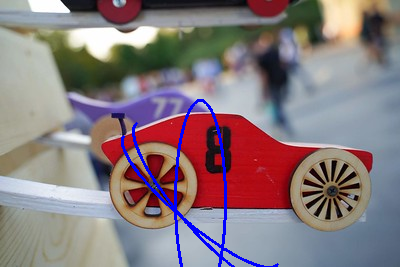

In [0]:
W = 400

thickness = 2
line_type = 8
angle = 40
cv.ellipse(img,
                (W // 2, W // 2), # ? position - середина; // - целочисленное деление
                (W // 4, W // 16), # ? position
                angle, # повернуть на угол
                0, # рисовать контур от 0 градусов 
                180, # до 180 градусов (т.е. половина эллипса)
                (255, 0, 0), # цвет контура 
                thickness, # толщина контура
                line_type) 

cv2_imshow(img)

# img = cv2.ellipse(img,(256,256),(100,50),0,0,180,255,-1)


**Line**

In [0]:
cv.line(img,
             start,
             end,
             (0, 0, 0),
             thickness,
             line_type)

**Circle**

In [0]:
cv.circle(img,
               center,
               W // 32,
               (0, 0, 255),
               thickness,
               line_type)

#img = cv2.circle(img,(447,63), 63, (0,0,255), -1) #fill


**Rect**

To draw a rectangle, you need top-left corner and bottom-right corner of rectangle



In [0]:
cv.rectangle(rook_image, 
              (0, 7 * W // 8),
              (W, W),
              (0, 255, 255),
              -1,
              8)

# img = cv2.rectangle(img,(384,0),(510,128),(0,255,0),3)

**Text**

https://docs.opencv.org/3.4.7/df/d61/tutorial_random_generator_and_text.html

In [0]:
cv.putText(img, "Text", )
           
#img	=	cv.putText(	img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]]	)

font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(img,'OpenCV',(10,500), font, 4,(255,255,255),2,cv2.LINE_AA)


## 9. Images as functions

**Adding images**

Images should have appropriate shape. Because they are just MATRICES!

image addition is done elementwise 


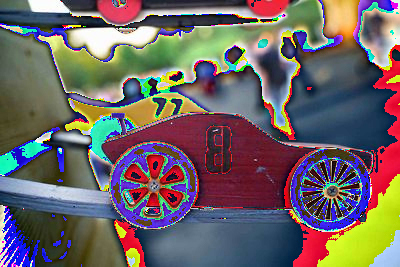

In [0]:
img1 = cv.imread("car.png")
img2 = cv.imread("car.png")

new_img = img1 + img2
cv2_imshow(new_img)

**Blending**

This is also image addition, but different weights are given to images so that it gives a feeling of blending or transparency. Images are added as per the equation below:



In [0]:
img1 = cv2.imread('ml.png')
img2 = cv2.imread('opencv_logo.jpg')

dst = cv2.addWeighted(img1,0.7,img2,0.3,0)

**Adding noise**

change sigma - get different results

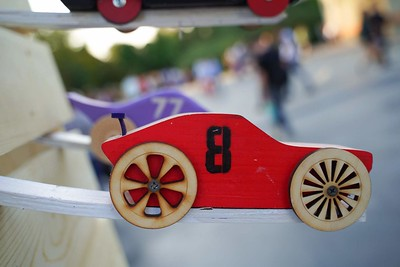

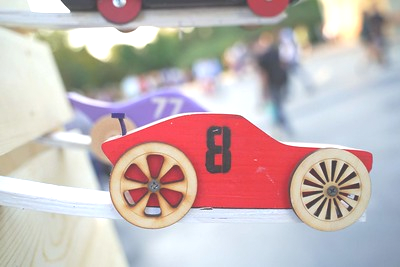

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


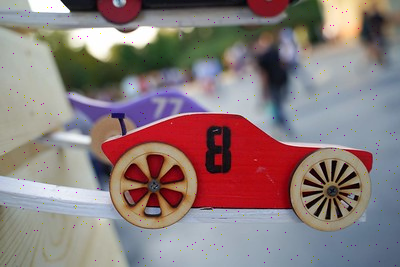

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


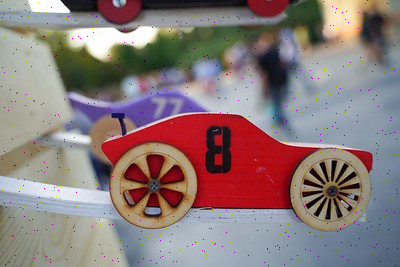

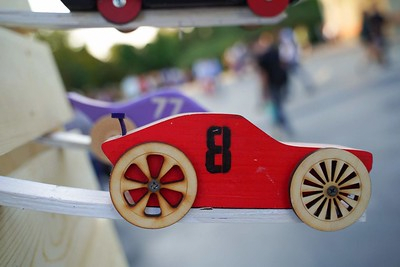

In [0]:
img = cv.imread("car.jpg")

# Gaussian noise
row, col, channels = img.shape
mean = 60
var = 0.1
sigma = var**0.5
gauss = np.random.normal(mean, sigma,(row, col, channels))
gauss = gauss.reshape(row, col, channels)
noisy = img + gauss
cv2_imshow(img)

cv2_imshow(noisy)

# pepper & salt noise
ow,col,ch = img.shape
s_vs_p = 0.5
amount = 0.004
out = np.copy(img)
## Salt mode
num_salt = np.ceil(amount * img.size * s_vs_p)
coords = [np.random.randint(0, i - 1, int(num_salt)) for i in img.shape]
out[coords] = 1
cv2_imshow(out)


## Pepper mode
num_pepper = np.ceil(amount* img.size * (1. - s_vs_p))
coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in img.shape]
out[coords] = 0
cv2_imshow(out)

# poisson
vals = len(np.unique(img))
vals = 20 ** np.ceil(np.log2(vals))
noisy = np.random.poisson(img * vals) / float(vals)
cv2_imshow(noisy)

## 10. Filters

The most common type of filters are linear, in which an output pixel's value (i.e. g(i,j)) is determined as a weighted sum of input pixel values

In a very general sense, convolution is an operation between every part of an image and an operator (kernel).



A kernel is essentially a fixed size array of numerical coefficeints along with an anchor point in that array, which is tipically located at the center.

![alt text](https://docs.opencv.org/2.4/_images/filter_2d_tutorial_kernel_theory.png)



**How does it work?**

Assume you want to know the resulting value of a particular location in the image. The value of the convolution is calculated in the following way:



1.   Place the kernel anchor on top of a determined pixel, with the rest of the kernel overlaying the corresponding local pixels in the image.
2.   Multiply the kernel coefficients by the corresponding image pixel values and sum the result.
3. Place the result to the location of the anchor in the input image.
4. Repeat the process for all pixels by scanning the kernel over the entire image.
Expressing the procedure above in the form of an equation we would have:
![alt text](https://docs.opencv.org/2.4/_images/math/f285c6bef42635bd97bc8d30371ee31ef03f6872.png)










in OpenCV there is function filter2D. We can build our own filters with this function.

**Normalized Box Filter**

smoothing in order to reduce noise

Original Image


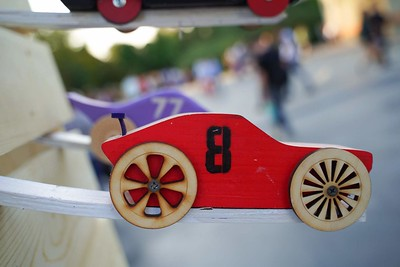

After filter, kernel=3
[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


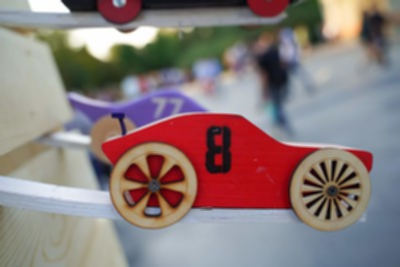

After filter, kernel=5
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


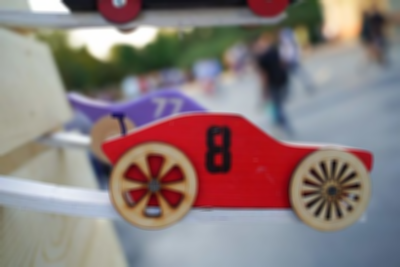

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
print("Original Image")
cv2_imshow (src)
# Initialize ddepth argument for the filter
ddepth = -1 # it is -1 by default

kernel_size = 3
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) 
kernel /= (kernel_size * kernel_size) # divide matrix over sum of all weights - > make matrix of averages
dst = cv.filter2D(src, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(dst)

kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel /= (kernel_size * kernel_size) # divide matrix over sum of all weights - > make matrix of averages
dst2 = cv.filter2D(src, ddepth, kernel)
print("After filter, kernel=5")
print(kernel)
cv2_imshow(dst2)


**(Almost) Sobel operator**

Original Image


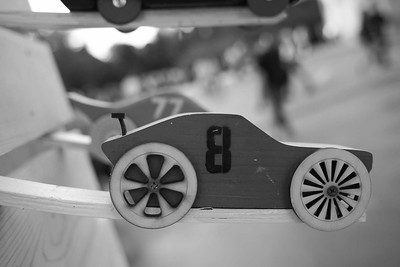

After filter, kernel=3
[[-1.  0.  1.]
 [-2.  0.  2.]
 [-1.  0.  1.]]


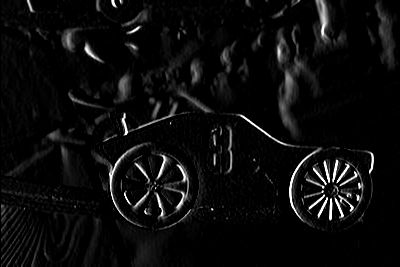

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow (gray)
# Initialize ddepth argument for the filter
ddepth = -1

kernel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)  # Sobel operator

# here we just multiply in a certain way original image matrix and filter(kernel) matrix and get edge-like something
after_filter = cv.filter2D(gray, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(after_filter)

**Prewitt**

Original Image


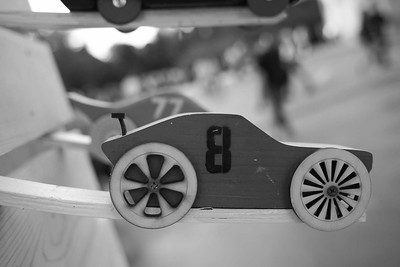

After filter, kernel=3
[[-1.  0.  1.]
 [-1.  0.  1.]
 [-1.  0.  1.]]


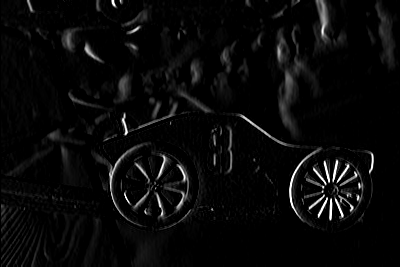

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow (gray)
# Initialize ddepth argument for the filter
ddepth = -1

kernel = np.array([[-1, 0, 1], 
                   [-1, 0, 1], 
                   [-1, 0, 1]], dtype=np.float32)  # Prewitt operator

after_filter = cv.filter2D(gray, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(after_filter)

**Create a Roberts operator**

Original Image


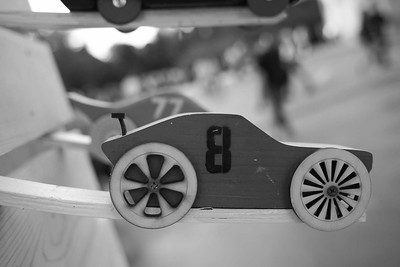

After filter, kernel=3
[[ 0.  1.]
 [-1.  0.]]


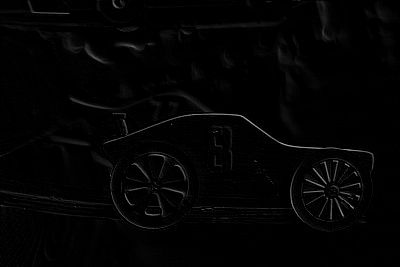

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow (gray)
# Initialize ddepth argument for the filter
ddepth = -1

kernel = np.array([[0, 1], 
                   [-1, 0]], dtype=np.float32)  # Roberts-like operator, but only gives us horizontal lines

after_filter = cv.filter2D(gray, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(after_filter)

After filter, kernel=3
[[ 1.  0.]
 [ 0. -1.]]


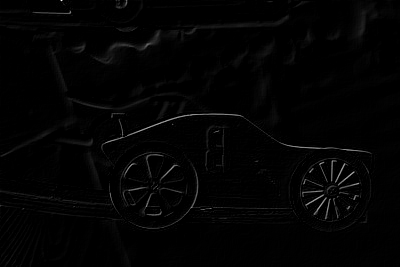

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
ddepth = -1

kernel = np.array([[1, 0], 
                   [0, -1]], dtype=np.float32)  # Roberts-like operator, but only gives us horizontal lines

after_filter = cv.filter2D(gray, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(after_filter)

After filter, kernel=3
[[ 1. -1.]
 [ 0.  0.]]


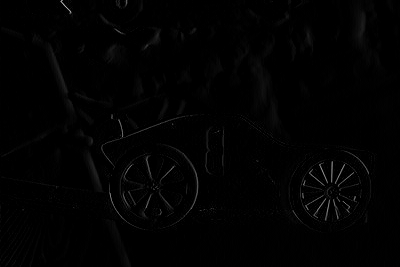

In [0]:
src = cv.imread("car.png", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
ddepth = -1

kernel = np.array([[1, -1], 
                   [0, 0]], dtype=np.float32)  # Roberts-like operator, but only gives us vertical lines

#kernel = kernel / (1/8)
after_filter = cv.filter2D(gray, ddepth, kernel)
print("After filter, kernel=3")
print(kernel)
cv2_imshow(after_filter)

**Blur Filters**

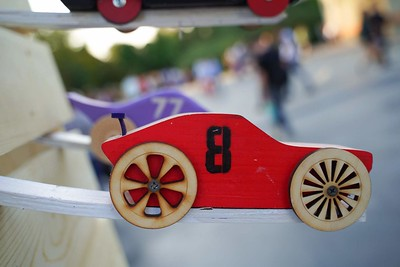

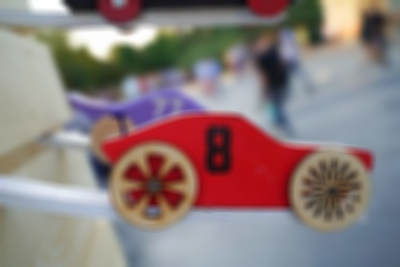

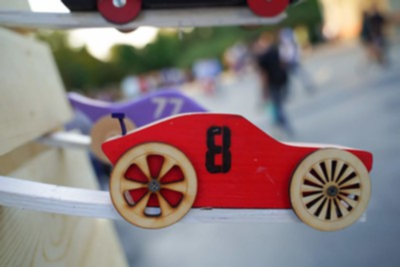

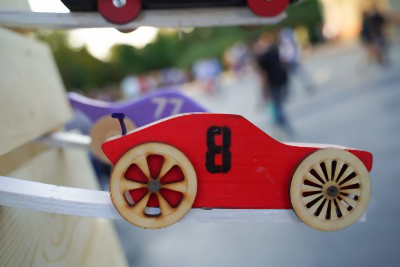

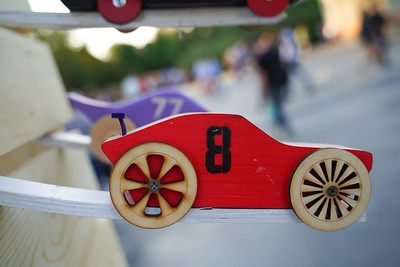

In [0]:
img = cv.imread("car.png")
cv2_imshow(img)

# Blur Filter
dst = cv.blur(img, (9, 9)) # (9,9) - Kernel size
cv2_imshow(dst)

# Gaussian Blur
dst = cv.GaussianBlur(img, (3, 3), 0)
cv2_imshow(dst)

# Median Blur
dst = cv.medianBlur(img, 3)
cv2_imshow(dst)

# Bilateral Filter
d = 10 # diameter of each pixel neigborhood
dst = cv.bilateralFilter(src, d, 3 * 2, 3 / 2)
cv2_imshow(dst)

## 11. Edges

use Canny by default

#### Sobel in proper way


(opencv.org)

You can easily notice that in an edge, the pixel intensity changes in a notorious way. A good way to express changes is by using derivatives. A high change in gradient indicates a major change in the image.


The Sobel Operator is a discrete differentiation operator. It computes an approximation of the gradient of an image intensity function

The Sobel Operator combines Gaussian smoothing and differentiation

We calculate two derivatives:
1. Horizontal changes Gx = Kx * I
2. Vertical changes Gy = Ky * I
3. At each point of the image we calculate an approximation of the gradient in that point by combining both results above

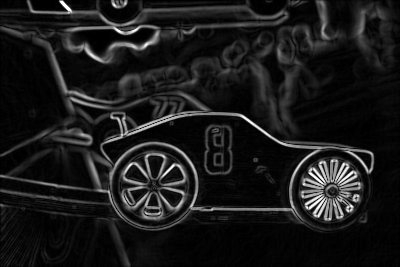

In [0]:
img = cv.imread("car.png")
img_blur = cv.GaussianBlur(img, (3, 3), 0)
img_gray = cv.cvtColor(img_blur, cv.COLOR_BGR2GRAY)

scale = 1
delta = 0
ddepth = cv.CV_16S

# Gx
grad_x = cv.Sobel(img_gray, ddepth, 1, 0, ksize=3, scale=scale, delta=delta, borderType=cv.BORDER_DEFAULT)
# Gy
grad_y = cv.Sobel(img_gray, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv.BORDER_DEFAULT)   

abs_grad_x = cv.convertScaleAbs(grad_x)
abs_grad_y = cv.convertScaleAbs(grad_y)

grad = cv.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

cv2_imshow(grad)

#### Canny Edge detector

The Canny Edge detector was developed by John F. Canny in 1986. Also known to many as the optimal detector.

Steps to apply:

1.   Get rid of noise (with Gaussian filter)
2.   Find the intensity gradient of the image
3.   Non-maximum suppression is applied. This removes pixels that are not considered to be part of an edge. Hence, only thin lines (candidate edges) will remain.
4.   Hysteresis: The final step. Canny does use two thresholds (upper and lower):

  * If a pixel gradient is higher than the upper threshold, the pixel is accepted as an edge
  * If a pixel gradient value is below the lower threshold, then it is rejected.
  * If the pixel gradient is between the two thresholds, then it will be accepted only if it is connected to a pixel that is above the upper threshold.
Canny recommended a upper:lower ratio between 2:1 and 3:1.


**Fortunately there is cv.Canny() function ready to use!**



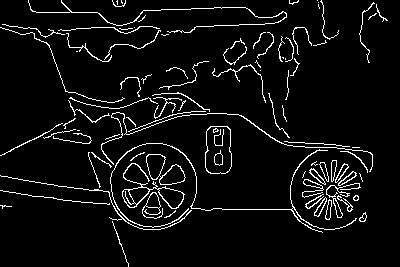

RGB image


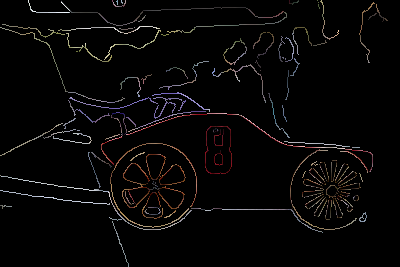

In [0]:
low_threshold = 40 # pixel value. Try different values 
ratio = 3
kernel_size = 3

img = cv.imread("car.png")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_blur = cv.blur(img_gray, (3,3))

detected_edges = cv.Canny(img_blur, low_threshold, low_threshold*ratio, kernel_size)

mask = detected_edges != 0
dst = img * (mask[:, :, None].astype(img.dtype))

cv2_imshow(detected_edges)

print("RGB image")
cv2_imshow(dst)

#### Laplace operator

What if we take 2nd derivative?


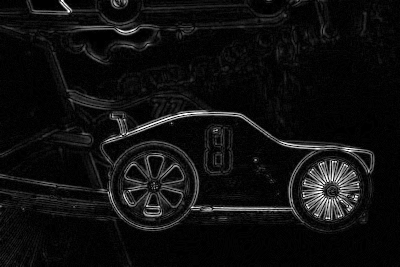

In [0]:
ddepth = cv.CV_16S
kernel_size = 3

img = cv.imread("car.png")
img_blur = cv.GaussianBlur(img, (3, 3), 0)
img_gray = cv.cvtColor(img_blur, cv.COLOR_BGR2GRAY)

dst = cv.Laplacian(img_gray, ddepth, ksize=kernel_size)

# converting back to uint8
abs_dst = cv.convertScaleAbs(dst)

cv2_imshow(abs_dst)

#### Find contours

Contour is somethong we can use (unlike edge). Each contour is stored as a vector of points



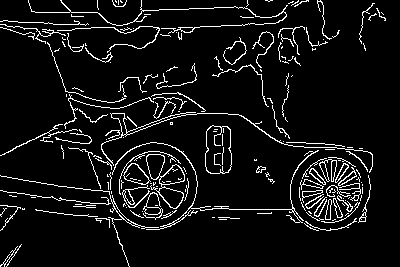

In [0]:
import random as rng

img = cv.imread("car.png")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

low_threshold = 40 # pixel value 
ratio = 3

edges = cv.Canny(img_gray, low_threshold, low_threshold * ratio)
_, contours, hierarchy = cv.findContours(edges, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
#print(contours)

drawing = np.zeros((edges.shape[0], edges.shape[1], 3), dtype=np.uint8)
for i in range(len(contours)):
  #color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
  color = (255, 255, 255)
  cv.drawContours(drawing, contours, i, color, 1, cv.LINE_8, hierarchy, 0)


cv2_imshow(drawing)

#### Application: Bubbles detection

In [0]:
# https://colab.research.google.com/drive/10aK4pDWAIJLw3A7TYAvqxyx8Rgja78xC#scrollTo=0oKaKj_-p1CB&line=59&uniqifier=1

## 12. Morphological operations

(opencv.org)

Morphology is a set of image processing operations that process images based on predefined structuring elements known also as kernels. The value of each pixel in the output image is based on a comparison of the corresponding pixel in the input image with its neighbors. By choosing the size and shape of the kernel, you can construct a morphological operation that is sensitive to specific shapes regarding the input image.

Two of the most basic morphological operations are dilation and erosion. Dilation adds pixels to the boundaries of the object in an image, while erosion does exactly the opposite. The amount of pixels added or removed, respectively depends on the size and shape of the structuring element used to process the image. In general the rules followed from these two operations have as follows:



In short: A set of operations that process images based on shapes. Morphological operations apply a structuring element to an input image and generate an output image.


The most basic morphological operations are: Erosion and Dilation. They have a wide array of uses, i.e. :
* Removing noise
* Isolation of individual elements and joining disparate elements in an image.
* Finding of intensity bumps or holes in an image

#### Delation

As the kernel B is scanned over the image, we compute the maximal pixel value overlapped by B and replace the image pixel in the anchor point position with that maximal value. Maximizing operation causes bright regions within an image to "grow" (therefore the name dilation).


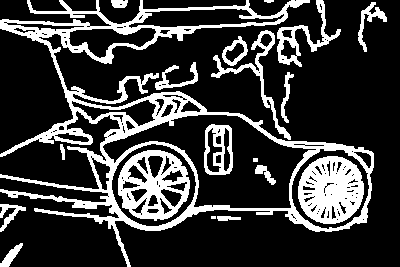

In [0]:
kernel = np.ones((3,3),np.uint8)
img_contours = drawing # from Unit 11
img_delation = cv.dilate(img_contours, kernel, iterations=1)
cv2_imshow(img_delation)

#### Erosion

This operation is the sister of dilation. It computes a local minimum over the area of given kernel.
As the kernel B is scanned over the image, we compute the minimal pixel value overlapped by B and replace the image pixel under the anchor point with that minimal value.
Analagously to the example for dilation, we can apply the erosion operator to the original image (shown above). You can see in the result below that the bright areas of the image get thinner, whereas the dark zones gets bigger.



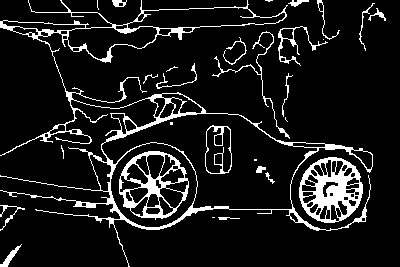

In [0]:
kernel = np.ones((3,3),np.uint8)
erode = cv.erode(img_delation, kernel, iterations = 1)
cv2_imshow(erode)

#### Opening

It is obtained by the erosion of an image followed by a dilation

Useful for removing small objects (it is assumed that the objects are bright on a dark foreground)


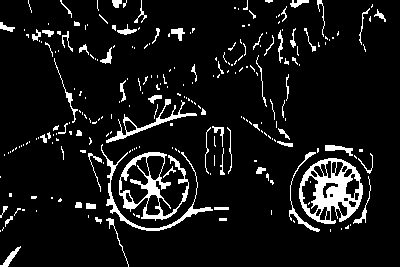

In [0]:
img = erode
dst = cv.morphologyEx(img, cv.MORPH_OPEN, (5,5), iterations=1)

cv2_imshow(dst)

#### Closing

It is obtained by the dilation of an image followed by an erosion.

Useful to remove small holes (dark regions).




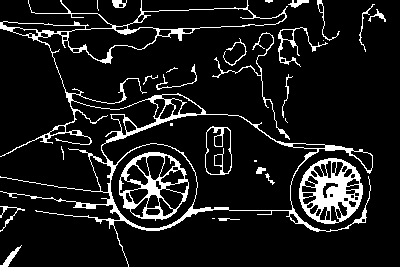

In [0]:
img = erode
dst = cv.morphologyEx(img, cv.MORPH_CLOSE, (5,5), iterations=1)

cv2_imshow(dst)

#### Morphological Gradient


It is the difference between the dilation and the erosion of an image.

It is useful for finding the outline of an object as can be seen below:



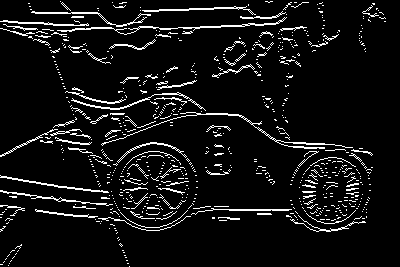

In [0]:
img = erode
dst = cv.morphologyEx(img, cv.MORPH_GRADIENT, (5,5), iterations=1)

cv2_imshow(dst)

#### Top Hat


It is the difference between an input image and its opening.



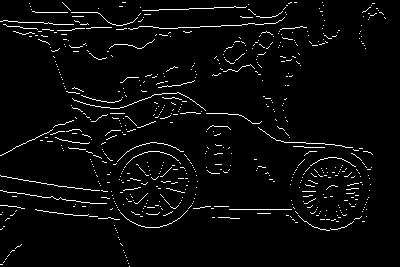

In [0]:
img = erode
dst = cv.morphologyEx(img, cv.MORPH_TOPHAT, (5,5), iterations=1)

cv2_imshow(dst)

#### Black Hat

It is the difference between the closing and its input image



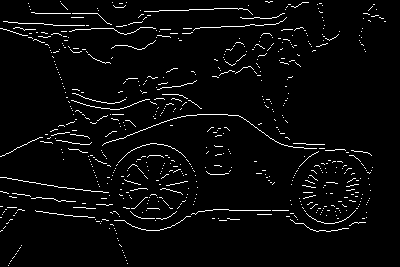

In [0]:
img = erode
dst = cv.morphologyEx(img, cv.MORPH_BLACKHAT, (2,2), iterations=1)

cv2_imshow(dst)

## 13. Template matching

Template Matching is a method for searching and finding the location of a template image in a larger image. OpenCV comes with a function cv2.matchTemplate() for this purpose. It simply slides the template image over the input image (as in 2D convolution) and compares the template and patch of input image under the template image. Several comparison methods are implemented in OpenCV. (You can check docs for more details). It returns a grayscale image, where each pixel denotes how much does the neighbourhood of that pixel match with template.



If input image is of size (WxH) and template image is of size (wxh), output image will have a size of (W-w+1, H-h+1). Once you got the result, you can use cv2.minMaxLoc() function to find where is the maximum/minimum value. Take it as the top-left corner of rectangle and take (w,h) as width and height of the rectangle. That rectangle is your region of template.



Где Уолли? Where is Wally?

https://i.pinimg.com/originals/04/f4/c1/04f4c1fdc7eb4b71de3e90caebc882dc.jpg

![alt text](https://i.pinimg.com/originals/04/f4/c1/04f4c1fdc7eb4b71de3e90caebc882dc.jpg)

(129, 52, 3)


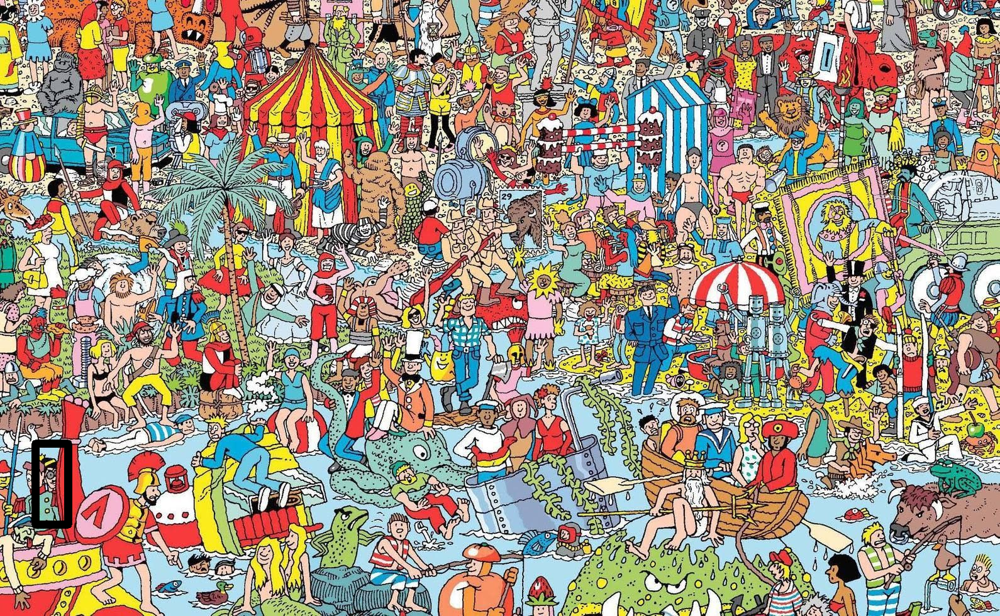

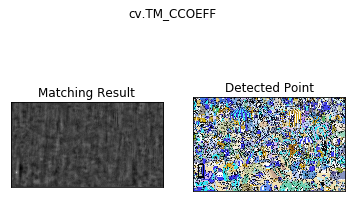

In [0]:
from matplotlib import pyplot as plt

img = cv.imread("map.jpg")
template = cv.imread("wally.jpg")

w = template.shape[1] 
h = template.shape[0] 
print(template.shape)

method = cv.TM_CCOEFF # or  cv.TM_CCOEFF_NORMED or cv.TM_CCORR or cv.TM_CCORR_NORMED or cv.TM_SQDIFF - takes min or  cv.TM_SQDIFF_NORMED - takes min

res = cv.matchTemplate(img, template, method)
min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)
cv.rectangle(img, top_left, bottom_right, 0, 12)

cv2_imshow(img)

plt.subplot(121)
plt.imshow(res, cmap = 'gray')
plt.title('Matching Result')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(img,cmap = 'gray')
plt.title('Detected Point')
plt.xticks([])
plt.yticks([])

plt.suptitle('cv.TM_CCOEFF')

plt.show()

## 14. Hough space


#### Lines

* The Hough Line Transform is a transform used to detect straight lines.
* To apply the Transform, first an edge detection pre-processing is desirable.

For Hough Transforms, we will express lines in the Polar system. Hence, a line equation can be written as:

![alt text](https://docs.opencv.org/3.4.7/Hough_Lines_Tutorial_Theory_0.jpg)


y=(−cosθ/sinθ)x+(r/sinθ)

Fortunately there is a ready to use cv.HoughLines function!

In [0]:
img = cv.imread("car.jpg")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray, 80, 120)
lines = cv.HoughLinesP(edges, 1, math.pi/2, 2, None, 30, 1);
for line in lines[0]:
    pt1 = (line[0],line[1])
    pt2 = (line[2],line[3])
    cv.line(img, pt1, pt2, (0,0,255), 3)
cv2_imshow(".png", img)


In [0]:
linesP = cv.HoughLinesP(dst, 1, np.pi / 180, 50, None, 50, 10)
    
if linesP is not None:
    for i in range(0, len(linesP)):
       l = linesP[i][0]
       cv.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)
    
cv.imshow("Source", src)
cv.imshow("Detected Lines (in red) - Standard Hough Line Transform", cdst)
cv.imshow("Detected Lines (in red) - Probabilistic Line Transform", cdstP)

#### Circles

In [0]:
src = cv.imread("car.jpg", cv.IMREAD_COLOR)
gray = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
gray = cv.medianBlur(gray, 5)
rows = gray.shape[0]
circles = cv.HoughCircles(gray, cv.HOUGH_GRADIENT, 1, rows / 8, param1=100, param2=30, minRadius=1, maxRadius=30)

for i in circles[0, :]:
  center = (i[0], i[1])
  # circle center
  cv.circle(src, center, 1, (0, 100, 100), 3)
  # circle outline
  radius = i[2]
  cv.circle(src, center, radius, (255, 0, 255), 3)
            
cv2_imshow(src)

## 15. Bounding box

In case you want somw rect frrame around your objects

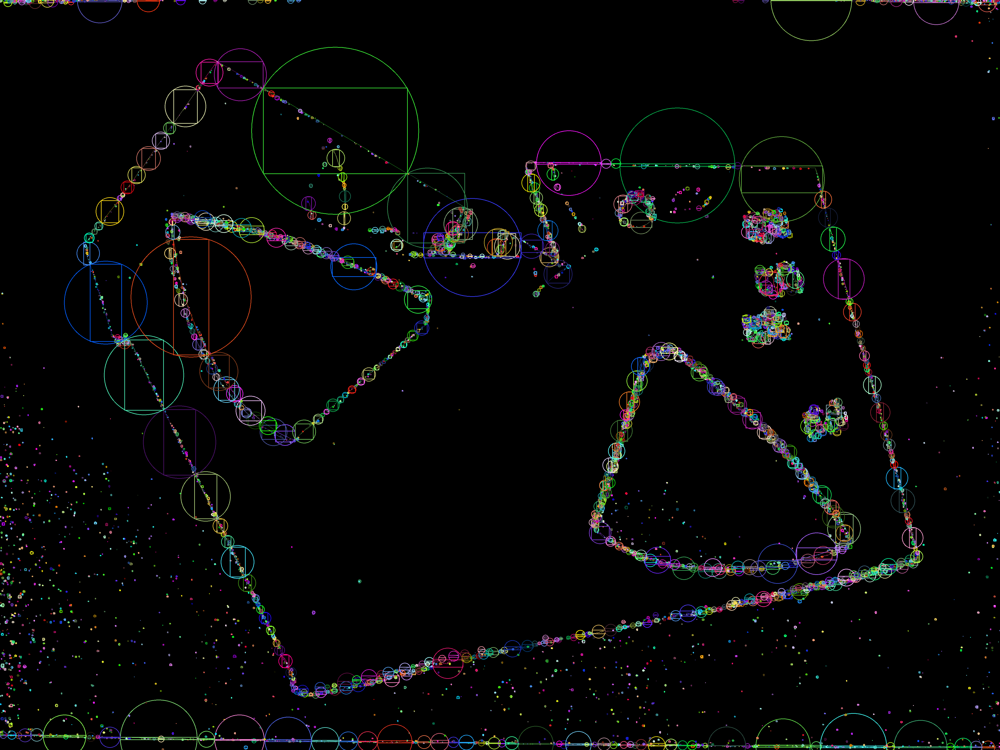

In [0]:
img = cv.imread("nobg_plastic.jpg")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY) 

threshold = 40
ratio = 2
canny_output = cv.Canny(img_gray, threshold, threshold * ratio)

_, contours, _ = cv.findContours(canny_output, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
contours_poly = [None]*len(contours)
boundRect = [None]*len(contours)
centers = [None]*len(contours)
radius = [None]*len(contours)
for i, c in enumerate(contours):
  contours_poly[i] = cv.approxPolyDP(c, 3, True)
  boundRect[i] = cv.boundingRect(contours_poly[i])
  centers[i], radius[i] = cv.minEnclosingCircle(contours_poly[i])    
    
drawing = np.zeros((canny_output.shape[0], canny_output.shape[1], 3), dtype=np.uint8)

for i in range(len(contours)):
  color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
  cv.drawContours(drawing, contours_poly, i, color)
  cv.rectangle(drawing, (int(boundRect[i][0]), int(boundRect[i][1])), \
          (int(boundRect[i][0]+boundRect[i][2]), int(boundRect[i][1]+boundRect[i][3])), color, 2)
  cv.circle(drawing, (int(centers[i][0]), int(centers[i][1])), int(radius[i]), color, 2)
    
cv2_imshow(drawing)

## 16. Image moments

You can also calculate moments, area etc. for contours (but you will have to grab only those contours you need).

Here we take acrylic remainders after laser cutting to get contours, area and then reuse them

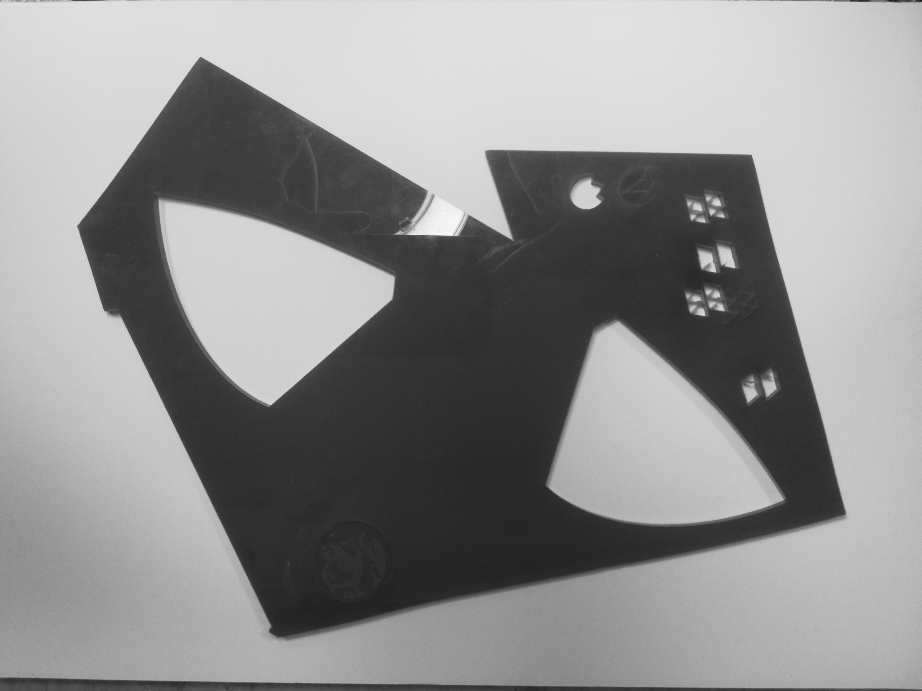

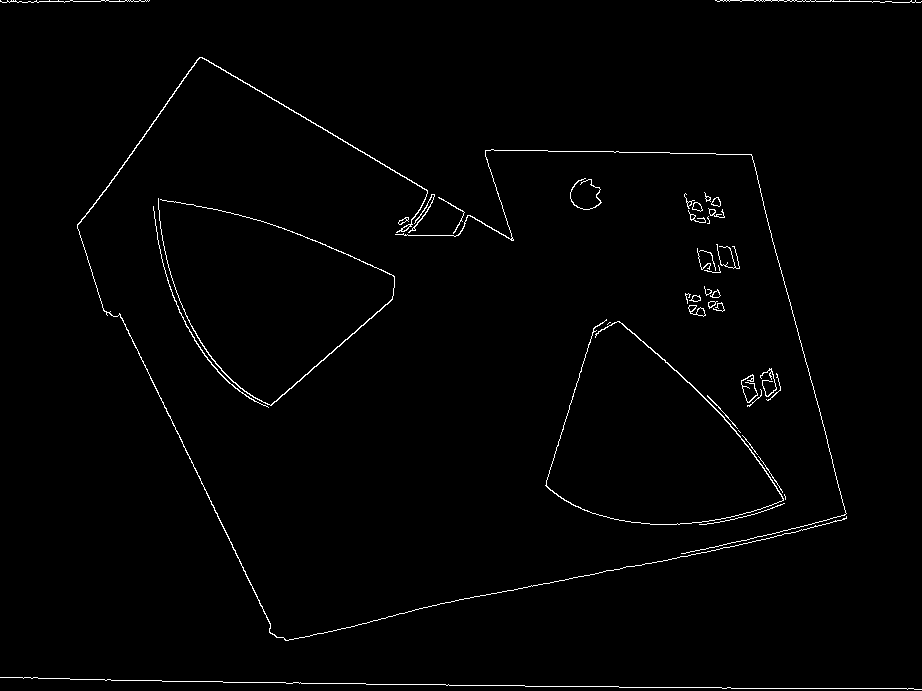

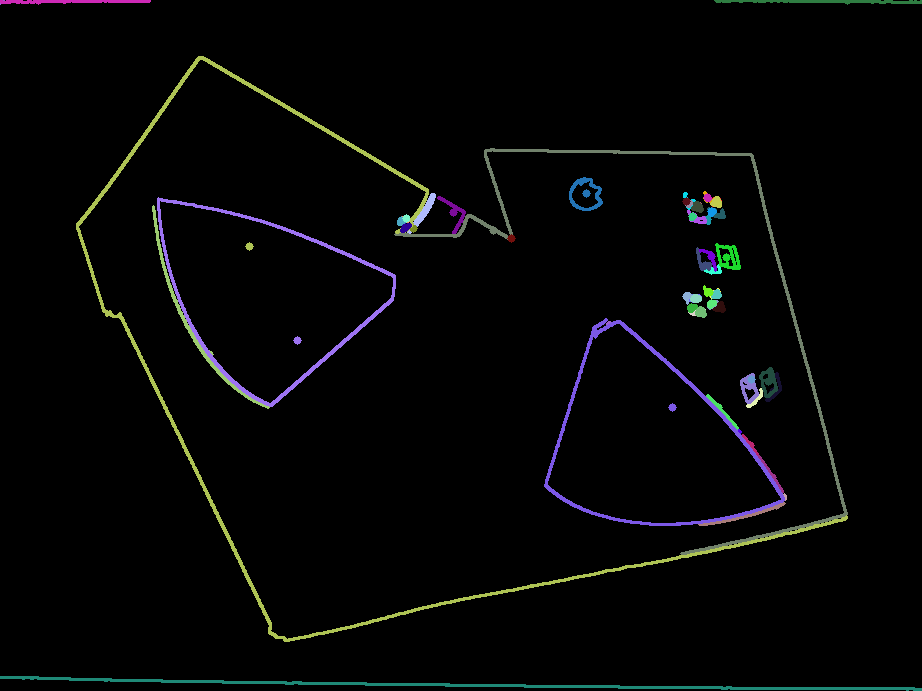

In [0]:
import random as rng 

img = cv.imread("nobg_plastic.jpg")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_blur = cv.blur(img_gray, (3,3))
img_blur = cv.resize(img_blur,None,fx=0.2, fy=0.2, interpolation = cv.INTER_CUBIC) # scaled down x0.2

cv2_imshow(img_blur)

low_threshold = 70 # pixel value 
ratio = 3

canny_output = cv.Canny(img_blur, low_threshold, low_threshold * ratio)
_, contours, _ = cv.findContours(canny_output, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv2_imshow(canny_output)


# erode = cv.erode(canny_output, (5,5), iterations = 1)
# grad = cv.morphologyEx(erode, cv.MORPH_GRADIENT, (3,3), iterations=1)
# close = cv.morphologyEx(grad, cv.MORPH_CLOSE, (5,5), iterations=1)
# cv2_imshow(erode)
# cv2_imshow(grad)
# cv2_imshow(close)


# Get the moments
mu = [None]*len(contours)
for i in range(len(contours)):
  mu[i] = cv.moments(contours[i])

# Get the mass centers
mc = [None]*len(contours)
for i in range(len(contours)):
  # add 1e-5 to avoid division by zero
  mc[i] = (mu[i]['m10'] / (mu[i]['m00'] + 1e-5), mu[i]['m01'] / (mu[i]['m00'] + 1e-5))


# Draw contours
drawing = np.zeros((canny_output.shape[0], canny_output.shape[1], 3), dtype=np.uint8)
    
for i in range(len(contours)):
  color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
  cv.drawContours(drawing, contours, i, color, 2)
  cv.circle(drawing, (int(mc[i][0]), int(mc[i][1])), 4, color, -1)
    
cv2_imshow(drawing)

# here we calc area for every contour found in the image
for i in range(len(contours)):
  print(' * Contour[%d] - Area (M_00) = %.2f - Area OpenCV: %.2f - Length: %.2f' % (i, mu[i]['m00'], cv.contourArea(contours[i]), cv.arcLength(contours[i], True)))

## 17. Export to  SVG

You will find your allContours.svg file on the left 

In [0]:
# saves outer most contour
# width = 1200
# height = 1200

# c = max(contours, key=cv.contourArea) #max contour
# f = open('outerPath.svg', 'w+')
# f.write('<svg width="'+str(width)+'" height="'+str(height)+'" xmlns="http://www.w3.org/2000/svg">')
# f.write('<path d="M')

# for i in range(len(c)):
#     #print(c[i][0])
#     x, y = c[i][0]
#     #print(x)
#     f.write(str(x)+  ' ' + str(y)+' ')

# f.write('"/>')
# f.write('</svg>')
# f.close()


w = 1200
h = 1200

# save all contours
with open("allContours.svg", "w+") as f:
    f.write(f'<svg width="{w}" height="{h}" xmlns="http://www.w3.org/2000/svg">')

    for c in contours:
        f.write('<path d="M')
        for i in range(len(c)):
            x, y = c[i][0]
            f.write(f"{x} {y} ")
        f.write('" style="stroke:pink"/>')
    f.write("</svg>")